## Land ice analysis, take the antarctica for example

In [7]:
import sys
import config
sys.path.append(config.root)
import numpy as np
import pyproj
import glob
import matplotlib.pyplot as plt
from utils.read_HDF5_ATL03 import read_HDF5_ATL03
from utils.get_ATL03_x_atc import get_ATL03_x_atc
from utils.atl06beam_to_dict import atl06beam_to_dict
from utils.geotif_io import readTiff
from utils.imgShow import imgShow



In [8]:
path_img = config.root + '/data/rs_img/pine_island_S3A_20180207T115228_20180207T115528.tif'


In [9]:
img, img_info = readTiff(path_img)
print(img_info)


{'geoextent': (-1741002.5304, -1437153.6139, -380178.3167, -165679.325), 'geotrans': (-1741002.5304, 295.8606781888998, 0.0, -165679.325, 0.0, -295.8606782068966), 'geosrs': '3031', 'row': 725, 'col': 1027, 'bands': 3}


lat: [-76.  -74.5 -74.5 -76.  -76. ]
lon: [ -98.  -98. -102. -102.  -98.]


Text(0.5, 1.0, 'Mosaic of Antarctica for Pine Island Glacier')

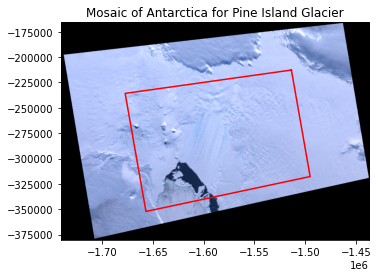

In [10]:
spatial_extent = np.array([-102, -76, -98, -74.5])
lat=spatial_extent[[1, 3, 3, 1, 1]]
lon=spatial_extent[[2, 2, 0, 0, 2]]
print('lat:',lat)
print('lon:',lon)
# project the coordinates to Antarctic polar stereographic
xy=np.array(pyproj.Proj(3031)(lon, lat))
imgShow(img, extent=img_info['geoextent'], color_bands=(0,1,2), clip_percent=5)
plt.plot(xy[0,:], xy[1,:], color='r')
plt.title('Mosaic of Antarctica for Pine Island Glacier')

### ATL03 photons (footprint diameter is 14 m) vs. ATL06 segments(about 40 m along track)


In [11]:
rgt="0027"
cycle="06"
beam='gt1l'
ATL03_file=glob.glob(os.path.join(config.root, f'data/icesat2/land_ice_antarctic/processed_ATL03*{rgt}{cycle}*.h5'))[0]
print('atl03_file_path:', ATL03_file)
ATL06_file=glob.glob(os.path.join(config.root, f'data/icesat2/land_ice_antarctic/processed_ATL06*{rgt}{cycle}*.h5'))[0]
print('atl06_file_path:', ATL06_file)


atl03_file_path: /Users/luo/OneDrive/Open-source-project/icesat2/data/icesat2/land_ice_antarctic/processed_ATL03_20191228123042_00270610_004_01.h5
atl06_file_path: /Users/luo/OneDrive/Open-source-project/icesat2/data/icesat2/land_ice_antarctic/processed_ATL06_20191228123042_00270610_004_01.h5


In [68]:
import h5py
file = config.root+ '/data/icesat2/land_ice_antarctic/preprocessed/processed_ATL06_20181020221744_03400112_004_01_gt1r_spot5_A.h5'

with h5py.File(file, "r") as fi:
    a = list(fi.keys())
    print(a)


['beam', 'cycle', 'dac', 'f_sn', 'h_elv', 'h_rb', 'lat', 'lon', 'orbit', 'q_flg', 'rgt', 's_elv', 's_fg', 'snr', 'spot', 't_sec', 't_year', 'tide_earth', 'tide_load', 'tide_ocean', 'tide_pole']


In [8]:
## ------- atl03 data reading ---------
# -- read the atl03 data:
IS2_atl03_mds, IS2_atl03_attrs, IS2_atl03_beams =read_HDF5_ATL03(ATL03_file)
# -- add x_atc to the obtained IS2_atl03_mds
get_ATL03_x_atc(IS2_atl03_mds, IS2_atl03_attrs, IS2_atl03_beams)
# -- select specific beam of ATL03
D3 = IS2_atl03_mds[beam] 

## ------- atl06 data reading ---------
# ATL06 data reading
D6=atl06beam_to_dict(ATL06_file, beam, index=None, epsg=3031)


dict_keys(['latitude', 'longitude', 'h_li', 'atl06_quality_summary', 'x_atc', 'y_atc', 'dh_fit_dx', 'dh_fit_dy', 'x', 'y', 'rgt', 'cycle', 'beam'])

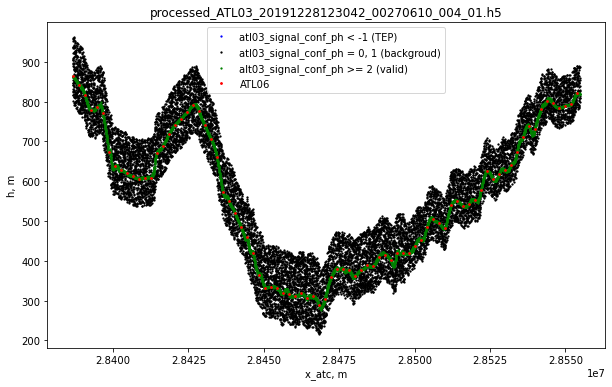

In [12]:
## ------- plot (atl03 photons vs. atl06 segments) ---------
# %matplotlib widget
f1, ax = plt.subplots(num=1,figsize=(10,6))
## --- atl03
TEP=(D3['heights']['signal_conf_ph'][:,3] <-1)   
ax.plot(D3['heights']['x_atc'][TEP][::100], D3['heights']['h_ph'][TEP][::100],'b.',markersize=2.5, label='atl03_signal_conf_ph < -1 (TEP)')
BG=(D3['heights']['signal_conf_ph'][:,3] ==0)   |  (D3['heights']['signal_conf_ph'][:,3] ==1)
ax.plot(D3['heights']['x_atc'][BG][::100], D3['heights']['h_ph'][BG][::100],'k.',markersize=2.5, label='atl03_signal_conf_ph = 0, 1 (backgroud)')
LMH=D3['heights']['signal_conf_ph'][:,3] >= 2
ax.plot(D3['heights']['x_atc'][LMH][::100], D3['heights']['h_ph'][LMH][::100],'g.', markersize=2.5, label='alt03_signal_conf_ph >= 2 (valid)')
## --- atl06
ax.plot(D6['x_atc'][::100], D6['h_li'][::100],'r.', markersize=3.5, label='ATL06')

h_leg=ax.legend()
plt.title(os.path.basename(ATL03_file))
ax.set_xlabel('x_atc, m')
ax.set_ylabel('h, m')
plt.show()


### check the quality of ATL06 segments with atl06_quality_summary variable


Text(0.5, 1.0, 'flagging with atl06_qualiy_summary')

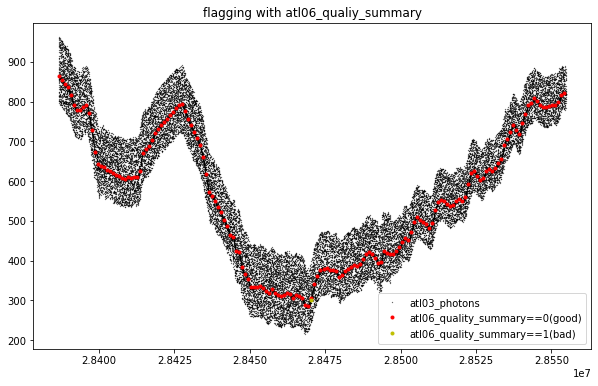

In [16]:
## -- plot the good/bad atl06 segments
fig=plt.figure(figsize=[10, 6])
h1=fig.add_subplot(111)
plt.plot(D3['heights']['x_atc'][::50], D3['heights']['h_ph'][::50],'k.', markersize=0.5, label='atl03_photons')
good=D6['atl06_quality_summary']==0
bad=D6['atl06_quality_summary']==1
plt.plot(D6['x_atc'][good][::50],  D6['h_li'][good][::50],'r.', label='atl06_quality_summary==0(good)')
plt.plot(D6['x_atc'][bad][::50], D6['h_li'][bad][::50],'y.', label='atl06_quality_summary==1(bad)')
plt.legend()
plt.title('flagging with atl06_qualiy_summary')


### Repeat track data from ATL06

In [17]:
# find all the files in the directory:
ATL06_files=glob.glob(os.path.join(config.root, 'data/icesat2/land_ice(antarctic)/processed_ATL06*.h5'))
D_dict={}
error_count=0
for file in ATL06_files:
    try:
        D_dict[file]=atl06beam_to_dict(file, beam, index=slice(0, -1, 25), epsg=3031)
    except KeyError as e:
        print(f'file {file} encountered error {e}')
        error_count += 1
print(f"read {len(D_dict)} data files of which {error_count} gave errors")



file /Users/luo/OneDrive/Open-source-project/icesat2/data/icesat2/land_ice(antarctic)/processed_ATL06_20190531114823_09650312_004_01.h5 encountered error 'Unable to open object (component not found)'
file /Users/luo/OneDrive/Open-source-project/icesat2/data/icesat2/land_ice(antarctic)/processed_ATL06_20191211024302_11480512_004_01.h5 encountered error 'Unable to open object (component not found)'
file /Users/luo/OneDrive/Open-source-project/icesat2/data/icesat2/land_ice(antarctic)/processed_ATL06_20200324081845_13530610_004_01.h5 encountered error 'Unable to open object (component not found)'
file /Users/luo/OneDrive/Open-source-project/icesat2/data/icesat2/land_ice(antarctic)/processed_ATL06_20190911070313_11480412_004_01.h5 encountered error 'Unable to open object (component not found)'
file /Users/luo/OneDrive/Open-source-project/icesat2/data/icesat2/land_ice(antarctic)/processed_ATL06_20190612112323_11480312_004_01.h5 encountered error 'Unable to open object (component not found)'


### plot repeat tracks of different cycles
#### Notice that:   
1. cycles 1 and 2 were not precicely repeated, and   
2. data from cycles 3 and onwards follow a relatively set of repeats.   
#### We've labeled the start of each track. In this area,   
1. ascending tracks are labeled on the right (true South) side of the plot, while   
2. descending tracks are labeled on the left (true North) side.  

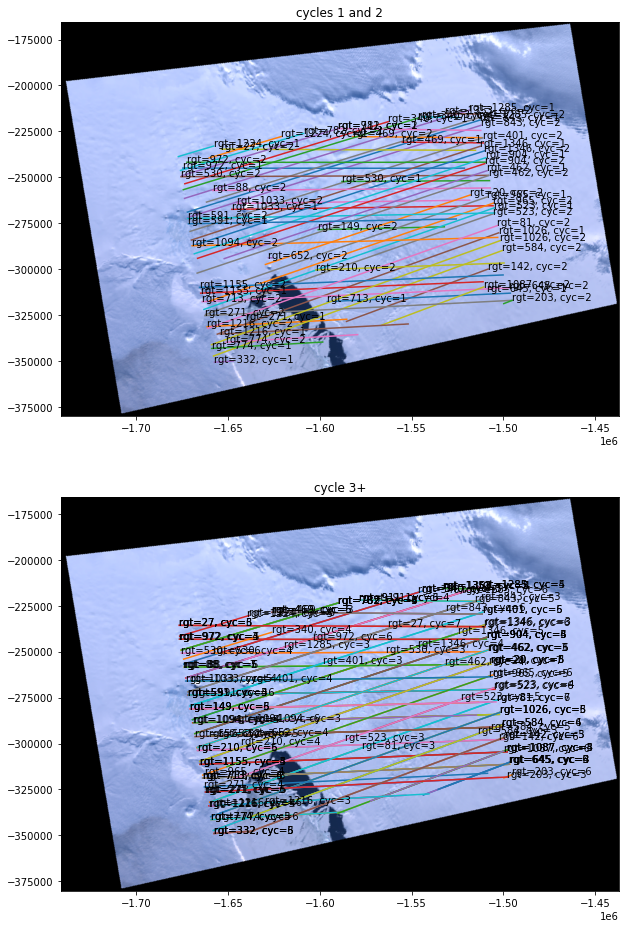

In [19]:
plt.figure(figsize=[10,16])
hax0=plt.gcf().add_subplot(211, aspect='equal')
imgShow(img, extent=img_info['geoextent'], color_bands=(0,1,2), clip_percent=5)

hax1=plt.gcf().add_subplot(212, aspect='equal', sharex=hax0, sharey=hax0)
imgShow(img, extent=img_info['geoextent'], color_bands=(0,1,2), clip_percent=5)

for fname, Di in D_dict.items():
    cycle=Di['cycle']
    if cycle <= 2:
        ax=hax0
    else:
        ax=hax1
    ax.plot(Di['x'], Di['y'])
    if True:
        try:
            if cycle  < 3:
                ax.text(Di['x'][0], Di['y'][0], f"rgt={Di['rgt']}, cyc={cycle}", clip_on=True)
            elif cycle >= 3:
                ax.text(Di['x'][0], Di['y'][0], f"rgt={Di['rgt']}, cyc={cycle}", clip_on=True)
        except IndexError:
            pass
hax0.set_title('cycles 1 and 2');
hax1.set_title('cycle 3+');



### Plot elevations of all tracks


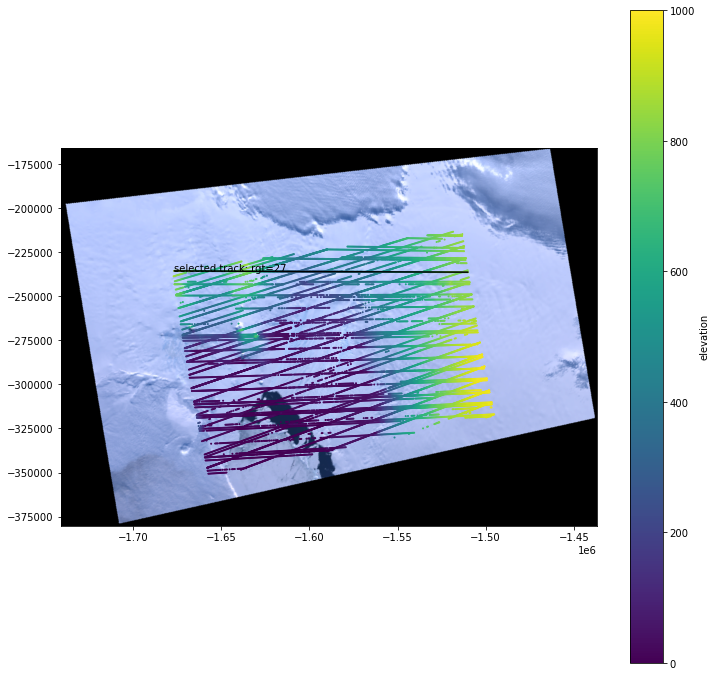

In [24]:
D_track_sel = D_dict[glob.glob(os.path.join(config.root, f'data/icesat2/land_ice(antarctic)/processed_ATL06_*_{rgt}03*_004*.h5'))[0]]

map_fig=plt.figure(figsize=(12,12))
map_ax=map_fig.add_subplot(111)
imgShow(img, extent=img_info['geoextent'], color_bands=(0,1,2), clip_percent=5)
for fname, Di in D_dict.items():
    good=Di['atl06_quality_summary']==0
    ms=map_ax.scatter(Di['x'][good], Di['y'][good], s=1, c=Di['h_li'][good], \
                  vmin=0, vmax=1000, label=fname)

map_ax.plot(D_track_sel['x'], D_track_sel['y'], 'k');    # projection coordinate
map_ax.text(D_track_sel['x'][0], D_track_sel['y'][0], f"selected track: rgt={D_track_sel['rgt']}", clip_on=True)
map_ax.set_aspect='equal'
plt.colorbar(ms, label='elevation');



### Plotting a repeat-track elevation profile (gt2l vs. gt2r)
#### - read gt2l and gt2r beams data


In [25]:
D_2l={}
D_2r={}

for cycle in ['03','04','05','06','07']:
    for filename in glob.glob(os.path.join(config.root, f'data/icesat2/land_ice(antarctic)/processed_ATL06_*_{rgt}{cycle}*_004*.h5')):
        print(filename)
        try:
            # read the left-beam data
            D_2l[filename]=atl06beam_to_dict(filename,'gt2l', index=None, epsg=3031)
            # read the right-beam data
            D_2r[filename]=atl06beam_to_dict(filename,'gt2r', index=None, epsg=3031)
        except Exception as e:
            print(f'filename={filename}, exception={e}')


/Users/luo/OneDrive/Open-source-project/icesat2/data/icesat2/land_ice(antarctic)/processed_ATL06_20190331013124_00270310_004_01.h5
/Users/luo/OneDrive/Open-source-project/icesat2/data/icesat2/land_ice(antarctic)/processed_ATL06_20190928165055_00270510_004_01.h5
/Users/luo/OneDrive/Open-source-project/icesat2/data/icesat2/land_ice(antarctic)/processed_ATL06_20191228123042_00270610_004_01.h5
/Users/luo/OneDrive/Open-source-project/icesat2/data/icesat2/land_ice(antarctic)/processed_ATL06_20200328081025_00270710_004_01.h5


#### - We plot every 20th atl06 segments.  
#### - We see here that we have elevations from cycles 3, 5, and 6, but cycle 4 is missing. That's likely because of clouds, and it's a fact of life in places where glaciers are found.

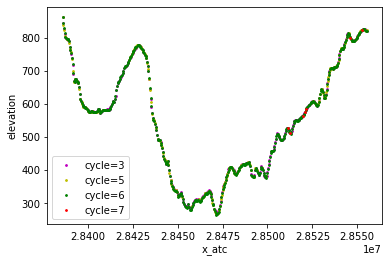

In [31]:
color = ['m', 'y', 'g','r', 'k']

for i, (filename, D2l_i) in enumerate(D_2l.items()):
    good = D2l_i['atl06_quality_summary']==0
    plt.plot(D2l_i['x_atc'][good][::20], D2l_i['h_li'][good][::20], '.', color=color[i], markersize=3.5, label=f"cycle={D2l_i['cycle']}")

plt.legend()
plt.xlabel('x_atc')
plt.ylabel('elevation');


### An repeat-track example with substantial cross-track slope
- we're going to plot both the left and right beams in the central beam pair.   
- We'll plot the left beam with a dot and the right beam with plus.

/Users/luo/OneDrive/Open-source-project/icesat2/data/icesat2/land_ice(antarctic)/processed_ATL06_20190331013124_00270310_004_01.h5
/Users/luo/OneDrive/Open-source-project/icesat2/data/icesat2/land_ice(antarctic)/processed_ATL06_20190928165055_00270510_004_01.h5
/Users/luo/OneDrive/Open-source-project/icesat2/data/icesat2/land_ice(antarctic)/processed_ATL06_20191228123042_00270610_004_01.h5
/Users/luo/OneDrive/Open-source-project/icesat2/data/icesat2/land_ice(antarctic)/processed_ATL06_20200328081025_00270710_004_01.h5


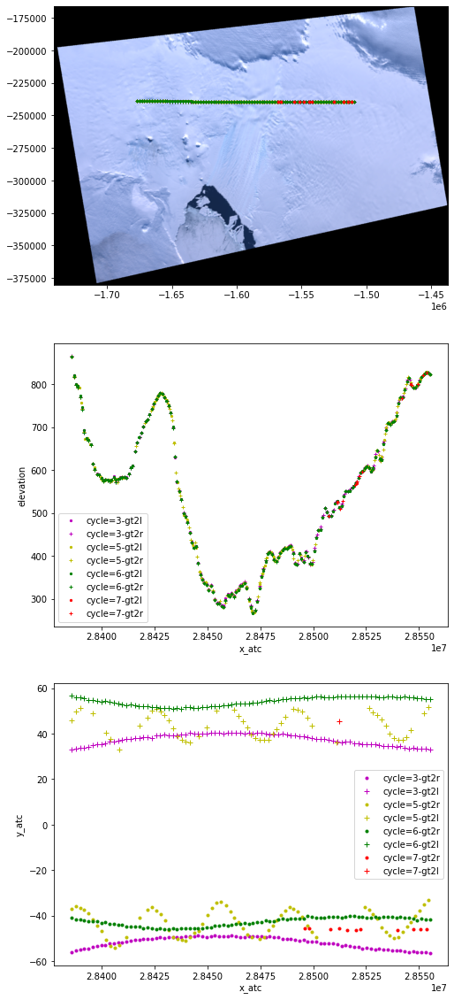

In [32]:
plt.figure(figsize=[8, 20]);
ax1=plt.subplot(311)   ## ---- plot the locations of both the D_2r and D_2l tracks
imgShow(img, extent=img_info['geoextent'], color_bands=(0,1,2), clip_percent=5)
ax2=plt.subplot(312)   ## ---- plot segments elevation of both the D_2r and D_2l tracks
ax3=plt.subplot(313, sharex=ax2) ## ----- plot relative positions (about 90m) between D_2r and D_2l tracks
for i, (filename, Dl) in enumerate(D_2l.items()):
    print(filename)
    Dl_good=Dl['atl06_quality_summary']==0
    hl=ax2.plot(Dl['x_atc'][Dl_good][::50], Dl['h_li'][Dl_good][::50], '.', markersize=4.5,color=color[i], label=f"cycle={Dl['cycle']}-{Dl['beam']}")
    ax1.plot(Dl['x'][::100], Dl['y'][::100], '.', markersize=4.5, color=hl[0]._color, label=f"cycle={Dl['cycle']}-{Dl['beam']}")
    Dr=D_2r[filename]
    Dr_good=Dr['atl06_quality_summary']==0
    ax2.plot(Dr['x_atc'][Dr_good][::50], Dr['h_li'][Dr_good][::50], '+', markersize=4.5, color=hl[0]._color, label=f"cycle={Dr['cycle']}-{Dr['beam']}")
    ax1.plot(Dr['x'][::100], Dr['y'][::100], '+', markersize=4.5, color=hl[0]._color, label=f"cycle={Dr['cycle']}-{Dr['beam']}")

    ax3.plot(Dr['x_atc'][::100], Dr['y_atc'][::100],'.', color=hl[0]._color, label=f"cycle={Dl['cycle']}-{Dr['beam']}")
    ax3.plot(Dl['x_atc'][::100], Dl['y_atc'][::100],'+', color=hl[0]._color, label=f"cycle={Dl['cycle']}-{Dl['beam']}")
    
ax2.legend()
ax3.legend()
for ax in [ax2, ax3]:
    ax.set_xlabel('x_atc')    
ax2.set_ylabel('elevation');
ax3.set_ylabel('y_atc');


### Correcting repeat elevations to the rgt by using cross-track slope
- Since this is a middle pair, we could be able to use the cross-track slope to correct both beams' elevations to y_atc=0.

/Users/luo/OneDrive/Open-source-project/icesat2/data/icesat2/land_ice(antarctic)/processed_ATL06_20190331013124_00270310_004_01.h5
/Users/luo/OneDrive/Open-source-project/icesat2/data/icesat2/land_ice(antarctic)/processed_ATL06_20190928165055_00270510_004_01.h5
/Users/luo/OneDrive/Open-source-project/icesat2/data/icesat2/land_ice(antarctic)/processed_ATL06_20191228123042_00270610_004_01.h5
/Users/luo/OneDrive/Open-source-project/icesat2/data/icesat2/land_ice(antarctic)/processed_ATL06_20200328081025_00270710_004_01.h5


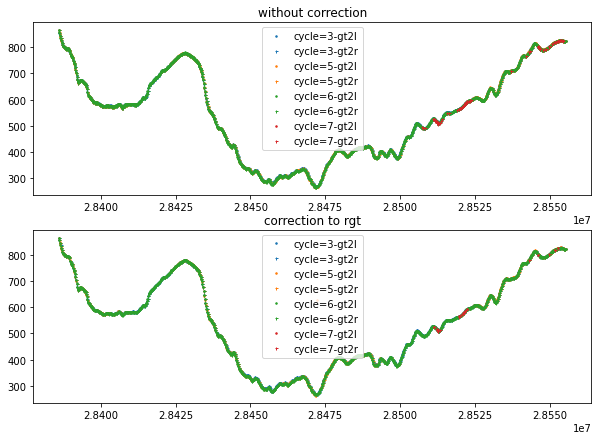

In [33]:
sam = 10
fig=plt.figure(figsize=(10,7))
ax1=fig.add_subplot(211)       ## without elevation correction
ax2=fig.add_subplot(212, sharex=ax1, sharey=ax1)   ## with elevation correction
color_dict={}
for filename, Dl in D_2l.items():
    print(filename)
    Dl_good=Dl['atl06_quality_summary']==0
    Dr=D_2r[filename]
    hl=ax1.plot(Dl['x_atc'][Dl_good][::sam], Dl['h_li'][Dl_good][::sam],'.', markersize=3, label=f"cycle={Dl['cycle']}-{Dl['beam']}")
    # save the color for this cycle so we can use it again
    color_dict[int(Dl['cycle'])]=hl[0]._color
    atc_corr=Dl['y_atc']*Dl['dh_fit_dy']
    ax2.plot(Dl['x_atc'][Dl_good][::sam], Dl['h_li'][Dl_good][::sam]-atc_corr[Dl_good][::sam], '.', markersize=3,color=color_dict[int(Dl['cycle'])], label=f"cycle={Dl['cycle']}-{Dl['beam']}")
    
    good_Dr=Dr['atl06_quality_summary']==0
    ax1.plot(Dr['x_atc'][good_Dr][::sam], Dr['h_li'][good_Dr][::sam], '+', markersize=3, color=color_dict[int(Dl['cycle'])], label=f"cycle={Dr['cycle']}-{Dr['beam']}")
    atc_corr=Dr['y_atc']*Dr['dh_fit_dy']
    ax2.plot(Dr['x_atc'][good_Dr][::sam], Dr['h_li'][good_Dr][::sam]-atc_corr[good_Dr][::sam], '+', markersize=3, color=color_dict[int(Dl['cycle'])], label=f"cycle={Dr['cycle']}-{Dr['beam']}")
 
ax1.legend()
ax2.legend()
ax1.set_title('without correction');
ax2.set_title('correction to rgt');
